In [ ]:
#Instalaciones de libreruas
#pip install matplotlib geopandas rasterio fiona pandas scikit-image numpy pillow

In [2]:
#pip install scikit-learn
#pip install geojson

In [3]:
#pip install pandas shapely

In [2]:
#importar librerias 
%matplotlib inline
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
import fiona
import pandas as pd
from rasterio.plot import show
from skimage.feature import match_template
import numpy as np
from PIL import Image

In [ ]:
# Puntos de control
pointData = gpd.read_file('puntos.shp') #se cargan los puntos de control referentes a arboles, indentificados en Qgis/ArcGIS
print('Sistema de Referencia de puntos de muestra: ' + str(pointData.crs))

#Cargar Imagen Satelital o de Drone
treeRaster = rasterio.open('Imagen_1.tif') #se carga una imagen en formato TIF
print('Sistema de Referencia de la imagen: ' + str(treeRaster.crs))
print('Número de bandas imagen: ' + str(treeRaster.count))
print('Interpretación de las bandas: ' + str(treeRaster.colorinterp))

Sistema de Referencia de puntos de muestra: EPSG:32639
Sistema de Referencia de la imagen: EPSG:32639
Número de bandas imagen: 4
Interpretación de las bandas: (<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>, <ColorInterp.alpha: 6>)


<Axes: >

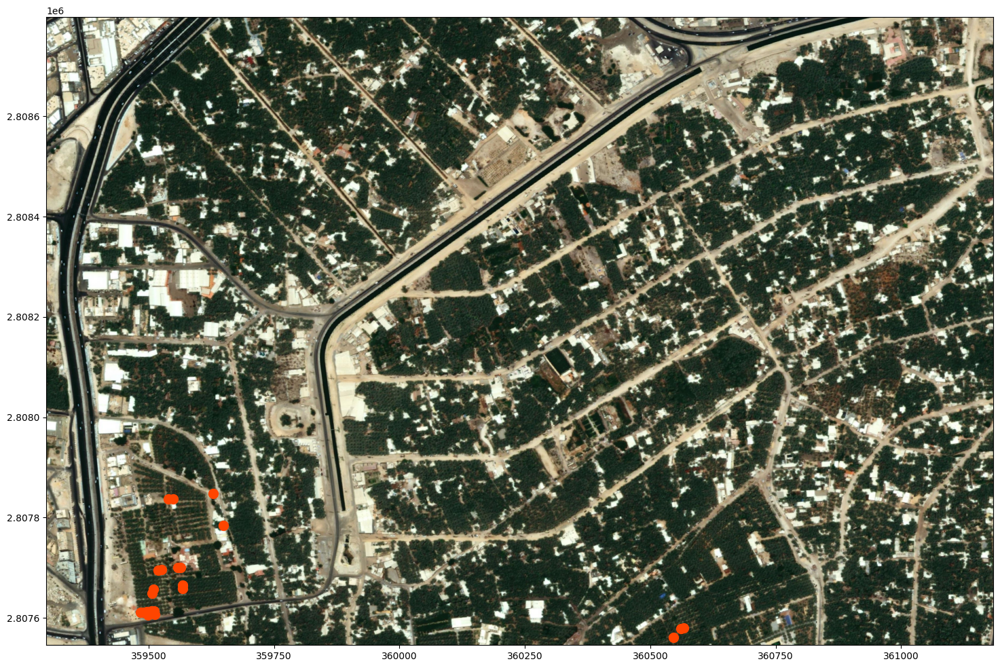

In [ ]:
#mostrar puntos de muestreo sobre imagen en matplotlib
fig, ax = plt.subplots(figsize=(18,18))
pointData.plot(ax=ax, color='orangered', markersize=100)
show(treeRaster, ax=ax)

In [ ]:
#seleccionar banda de interés: GREEN
GreenBand = treeRaster.read(2)

In [ ]:
#extraer valores de puntos de la imagen en filas/columnas de la imagen
surveyRowCol = []
for index, values in pointData.iterrows():
    x = values['geometry'].xy[0][0]
    y = values['geometry'].xy[1][0]
    row, col = treeRaster.index(x,y)
    print("Punto N°:%d corresponde a la fila, columna: %d, %d"%(index,row,col))
    surveyRowCol.append([row,col])

Punto N°:0 corresponde a la fila, columna: 2373, 376
Punto N°:1 corresponde a la fila, columna: 2373, 386
Punto N°:2 corresponde a la fila, columna: 2371, 399
Punto N°:3 corresponde a la fila, columna: 2385, 405
Punto N°:4 corresponde a la fila, columna: 2380, 431
Punto N°:5 corresponde a la fila, columna: 2368, 429
Punto N°:6 corresponde a la fila, columna: 2368, 418
Punto N°:7 corresponde a la fila, columna: 2297, 420
Punto N°:8 corresponde a la fila, columna: 2280, 427
Punto N°:9 corresponde a la fila, columna: 2206, 445
Punto N°:10 corresponde a la fila, columna: 2201, 458
Punto N°:11 corresponde a la fila, columna: 2195, 523
Punto N°:12 corresponde a la fila, columna: 2194, 535
Punto N°:13 corresponde a la fila, columna: 2264, 544
Punto N°:14 corresponde a la fila, columna: 2279, 543
Punto N°:15 corresponde a la fila, columna: 1921, 486
Punto N°:16 corresponde a la fila, columna: 1922, 506
Punto N°:17 corresponde a la fila, columna: 1899, 664
Punto N°:18 corresponde a la fila, col

In [15]:
# número de imágenes de la plantilla
print('Número de imagenes de muestra: %d'%len(surveyRowCol))
# definir el radio de analisis en pixeles
radio = 10

Número de imagenes de muestra: 22


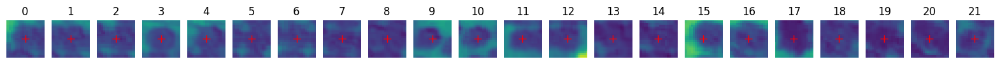

In [16]:
#Mostrar los puntos de interes
fig, ax = plt.subplots(1, len(surveyRowCol),figsize=(20,5))

for index, item in enumerate(surveyRowCol):
    row = item[0]
    col = item[1]
    ax[index].imshow(GreenBand)
    ax[index].plot(col,row,color='red', linestyle='dashed', marker='+',
     markerfacecolor='blue', markersize=8)
    ax[index].set_xlim(col-radio,col+radio)
    ax[index].set_ylim(row-radio,row+radio)
    ax[index].axis('off')
    ax[index].set_title(index)

C:\Users\jose.cordova\AppData\Local\Temp\ipykernel_7796\221701899.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, len(imageList),figsize=(12,12))


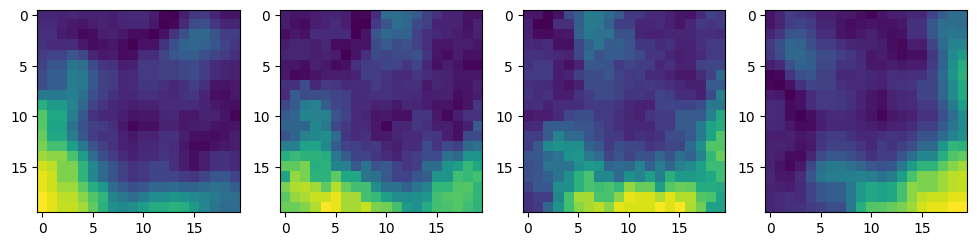

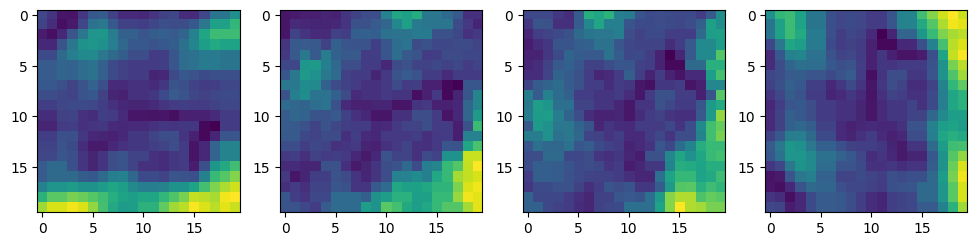

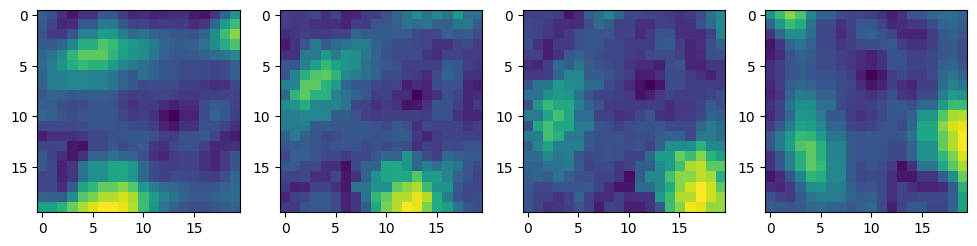

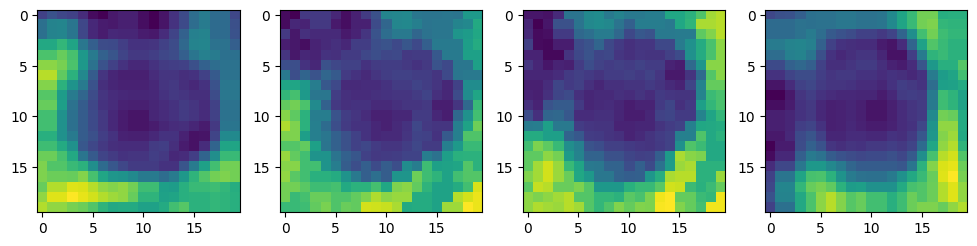

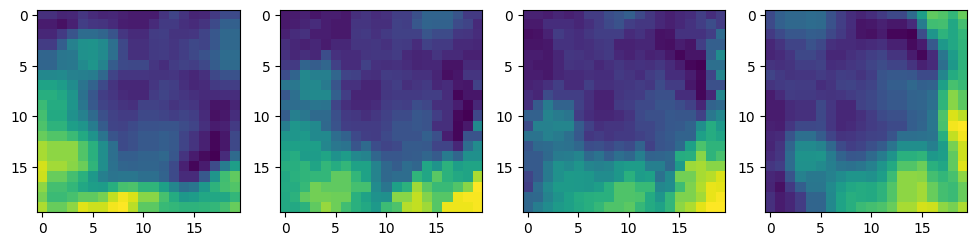

...

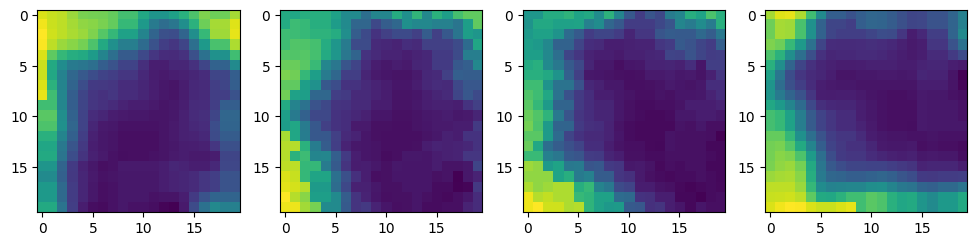

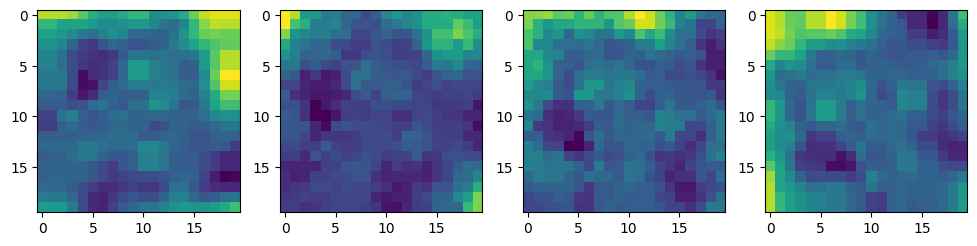

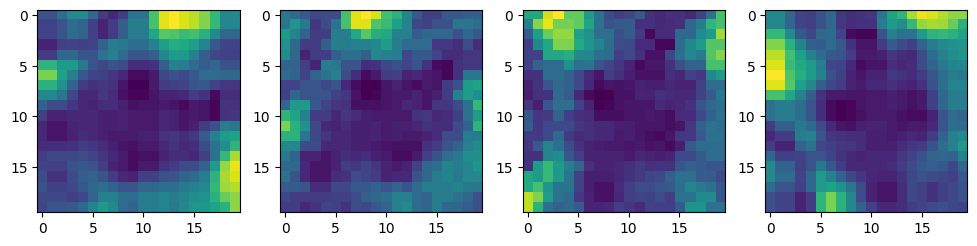

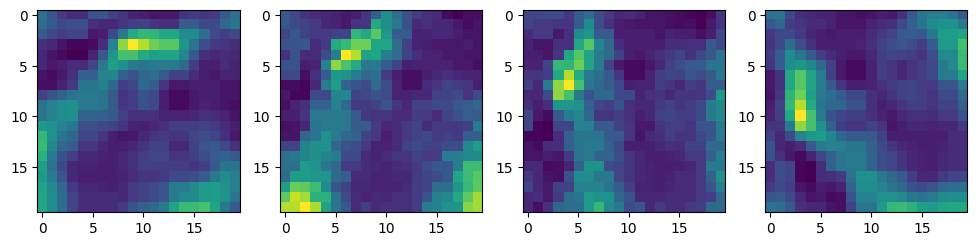

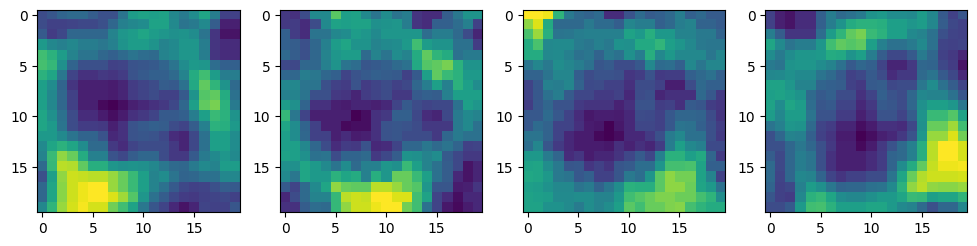

In [17]:
# comparación de cada imagen con la plantilla

listaresultados = []

templateBandList = []
for rowCol in surveyRowCol:
    imageList = []
    row = rowCol[0]
    col = rowCol[1]
    #añadir banda original
    imageList.append(GreenBand[row-radio:row+radio, col-radio:col+radio])
    #rotar imagenes
    templateBandToRotate = GreenBand[row-2*radio:row+2*radio, col-2*radio:col+2*radio]
    rotationList = [i*30 for i in range(1,4)]
    for rotation in rotationList:
        rotatedRaw = Image.fromarray(templateBandToRotate)
        rotatedImage = rotatedRaw.rotate(rotation)
        imageList.append(np.asarray(rotatedImage)[radio:-radio,radio:-radio])
    #mostrar imagenes originales y rotadas
    fig, ax = plt.subplots(1, len(imageList),figsize=(12,12))
    for index, item in enumerate(imageList):
        ax[index].imshow(imageList[index])
    #agregar el total de las imagenes
    templateBandList+=imageList

In [ ]:
# hacer coincidir la imagen de la plantilla con la ortofoto de arboles
matchXYList = []
for index, templateband in enumerate(templateBandList):
    if index%10 == 0:
        print('Coincidir la plantilla para la figura Nº %d'%index)
    matchTemplate = match_template(GreenBand, templateband, pad_input=True)
    matchTemplateFiltered = np.where(matchTemplate>np.quantile(matchTemplate,0.9996))
    for item in zip(matchTemplateFiltered[0],matchTemplateFiltered[1]):
        x, y = treeRaster.xy(item[0], item[1])
        matchXYList.append([x,y])

Coincidir la plantilla para la figura Nº 0
Coincidir la plantilla para la figura Nº 10
Coincidir la plantilla para la figura Nº 20
Coincidir la plantilla para la figura Nº 30
Coincidir la plantilla para la figura Nº 40
Coincidir la plantilla para la figura Nº 50
Coincidir la plantilla para la figura Nº 60
Coincidir la plantilla para la figura Nº 70
Coincidir la plantilla para la figura Nº 80


<Axes: >

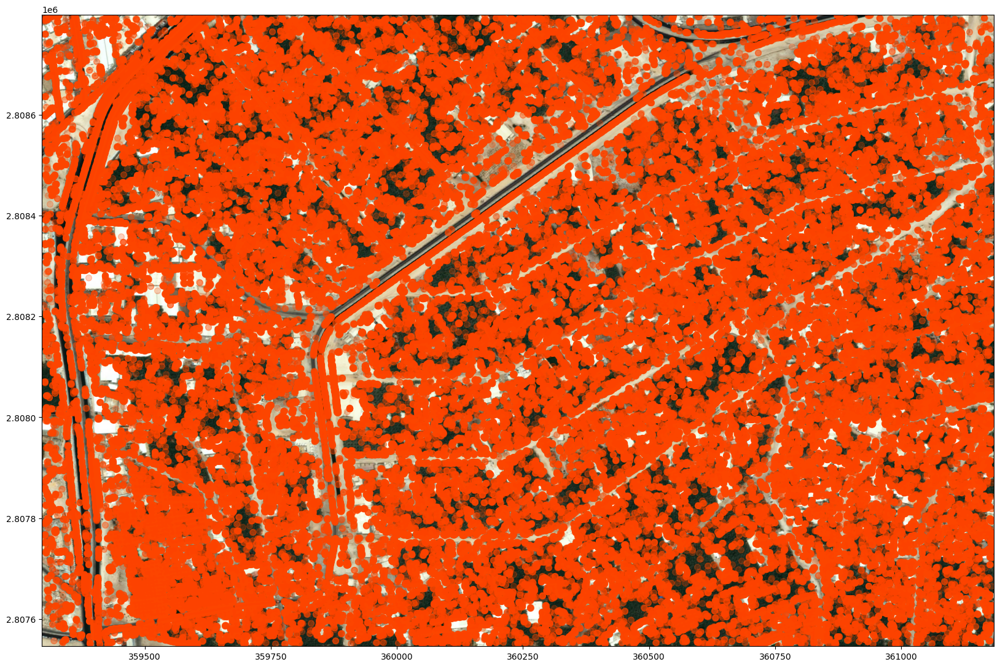

In [ ]:
# mostrar puntos interpretados
fig, ax = plt.subplots(figsize=(20, 20))
matchXYArray = np.array(matchXYList)
ax.scatter(matchXYArray[:,0],matchXYArray[:,1], marker='o',c='orangered', s=50, alpha=0.25)
show(treeRaster, ax=ax)

In [21]:
# analisis cluster - agrupamiento de puntos
from sklearn.cluster import Birch
brc = Birch(branching_factor=10000, n_clusters=None, threshold=2, compute_labels=True)
brc.fit(matchXYArray)
birchPoint = brc.subcluster_centers_
birchPoint

array([[ 360184.57881853, 2808795.4432515 ],
       [ 360015.23532071, 2808792.61010894],
       [ 360257.79200421, 2808787.91079168],
       ...,
       [ 360159.07728785, 2807595.52405022],
       [ 360356.58914309, 2807591.02435322],
       [ 361140.80288053, 2807559.19316329]])

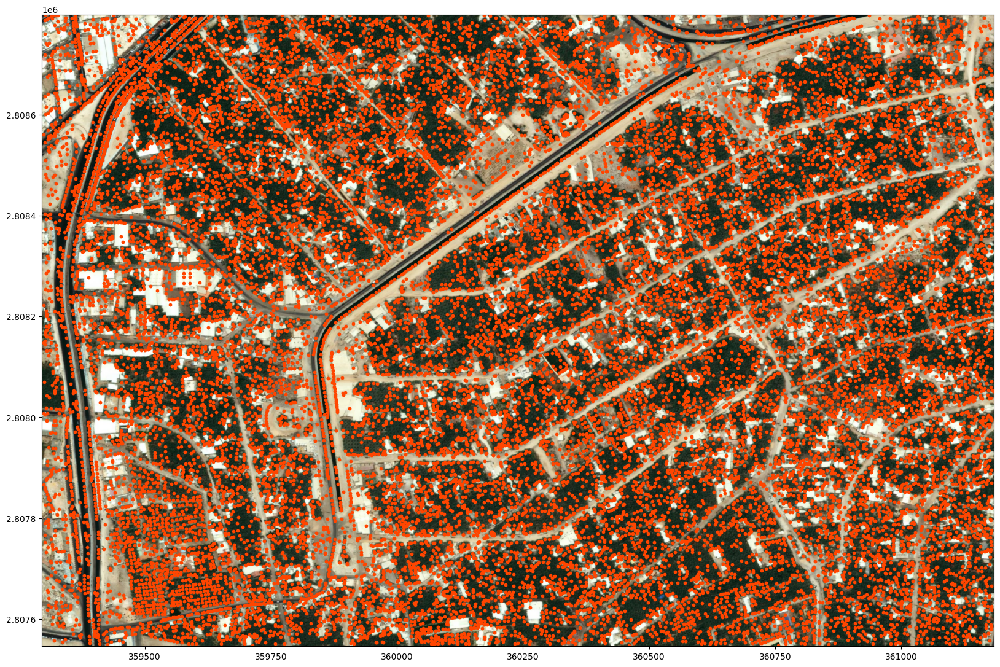

In [ ]:
# mostrar grupos de puntos
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111)
ax.scatter(birchPoint[:,[0]],birchPoint[:,[1]], marker='o',color='orangered',s=10)
show(treeRaster, ax=ax)
plt.show()

In [43]:
# guardar X y Y en archivo CSV
np.savetxt("Listado_arboles.csv", birchPoint, header='X,Y,Nombre',comments='', delimiter=",")

#importar puntos desde CSV
pointDf = pd.read_csv('Listado_arboles.csv',header=0)
pointDf.head()

# definir esquema del SHP
schema = {
    'geometry':'Point',
    'properties':[('Nombre','str')]
}

#Abrir el objeto SHP para escribir
pointShp = fiona.open('arboles_ML.shp', mode='w', driver='ESRI Shapefile',
          schema = schema, crs = "EPSG:32639")

#iterar cada columna y guardar en archivo. 
for index, row in pointDf.iterrows():
    rowDict = {
        'geometry' : {'type':'Point',
                     'coordinates': (row.X,row.Y)},
        'properties': {'Nombre' : row.Nombre},
    }
    pointShp.write(rowDict)
#cerrar objeto SHP
pointShp.close()

In [45]:
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd

# Leer el archivo CSV
pointDf = pd.read_csv('Listado_arboles.csv', header=0, names=["X", "Y", "Nombre"])

# Crear la geometría (asegúrate de que X=longitud y Y=latitud)
geometry = [Point(xy) for xy in zip(pointDf["X"], pointDf["Y"])]

# Definir el sistema de referencia (modifica si tus coordenadas no están en WGS 84)
crs = "EPSG:32639"  # Cambia a tu CRS original si las coordenadas son UTM
geo_df = gpd.GeoDataFrame(pointDf, geometry=geometry, crs=crs)

# Si el CRS original no es EPSG:4326, transforma las coordenadas a WGS 84
geo_df = geo_df.to_crs("EPSG:4326")

# Exportar a GeoJSON
geo_df.to_file("Conteo_1_ML.geojson", driver="GeoJSON")
print("Archivo GeoJSON creado exitosamente: Conteo.geojson")




Archivo GeoJSON creado exitosamente: Conteo.geojson
